In [ ]:
!pip install gensim
!pip install nltk
!pip install mpld3

In [ ]:
!pip install pyLDAvis

In [ ]:
import nltk
nltk.download('wordnet')

In [ ]:
import os
import zipfile
import time
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
%matplotlib inline
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.mixture import GaussianMixture
import time
from sklearn.decomposition import PCA
import gensim
from yellowbrick.text import FreqDistVisualizer
from yellowbrick.text import TSNEVisualizer
from yellowbrick.text import DispersionPlot
from sklearn.cluster import AgglomerativeClustering

In [ ]:
df=pd.read_csv(r'new_filee.csv')
df.head()

,Unnamed: 0,articleName,article_content
0,0,27.txt,﻿resveratrol pretreatment enhanced homing of s...
1,1,44 - Copy (6).txt,﻿the effect of soy-flour mesh size and its adh...
2,2,266 - Copy.txt,﻿background and purpose: dye is widely used in...
3,3,83 - Copy (26).txt,﻿determination of general and specific combini...
4,4,335 - Copy (8).txt,﻿the overall objective of this study was to de...


In [ ]:
number_total_sen=[]
for sen in df['article_content']:
    number_total_sen.append(sen.split())
 
number_total_word=[]
for sen in number_total_sen:
    for word in sen:
        number_total_word.append(word)
    
print(len(number_total_word))

1103368


In [ ]:
simple_all_words=[]
for e in df['article_content']:
    simple_all_words.append(gensim.utils.simple_preprocess(e))

simple_all_words = [val for sublist in simple_all_words for val in sublist]
print(len(simple_all_words))

1061604


In [ ]:
from nltk.stem import WordNetLemmatizer
lem_all_words=[WordNetLemmatizer().lemmatize(e) for e in simple_all_words]

In [ ]:
stopwords = nltk.download('stopwords')
from nltk.stem.snowball import SnowballStemmer
stemmer = SnowballStemmer("english")
stopwords = nltk.corpus.stopwords.words('english')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [ ]:
stop_all_words=[]
for e in lem_all_words:
    if e not in stopwords:
        stop_all_words.append(e)

In [ ]:
print(len(lem_all_words))
print(len(stop_all_words))

1061604
689126


In [ ]:
#this code is for counting the number of words in corpus tokenized text
'''
from collections import defaultdict

def leaders(xs, top=10):
    counts = defaultdict(int)
    for x in xs:
        counts[x] += 1
    return sorted(counts.items(), reverse=True, key=lambda tup: tup[1])[:top]
'''

'\nfrom collections import defaultdict\n\ndef leaders(xs, top=10):\n    counts = defaultdict(int)\n    for x in xs:\n        counts[x] += 1\n    return sorted(counts.items(), reverse=True, key=lambda tup: tup[1])[:top]\n'

In [ ]:
raw=[('wa', 10569),
 ('study', 5167),
 ('result', 5122),
 ('method', 4518),
 ('using', 3592),
 ('effect', 3440),
 ('model', 3247),
 ('used', 2681),
 ('based', 2533),
 ('ha', 2524),
 ('different', 2401),
 ('group', 2400),
 ('two', 2295),
 ('analysis', 2294),
 ('data', 2140),
 ('showed', 2125),
 ('system', 2077),
 ('also', 2034),
 ('time', 2026),
 ('level', 1922)]

In [ ]:
fr_stop_words=[]
for e in raw:
    fr_stop_words.append(e[0])
fr_stop_words=fr_stop_words+['proposed','paper','algorithm','approach','ann','one','process','model','effect',
                             'increase','health','method','reaserch','effect','increas','acid', 'respect','treatment', 'perform']
fr_stop_words

['wa',
 'study',
 'result',
 'method',
 'using',
 'effect',
 'model',
 'used',
 'based',
 'ha',
 'different',
 'group',
 'two',
 'analysis',
 'data',
 'showed',
 'system',
 'also',
 'time',
 'level',
 'proposed',
 'paper',
 'algorithm',
 'approach',
 'ann',
 'one',
 'process',
 'model',
 'effect',
 'increase',
 'health',
 'method',
 'reaserch',
 'effect',
 'increas',
 'acid',
 'respect',
 'treatment',
 'perform']

In [ ]:
#5% remove
689126*0.05

34456.3

In [ ]:
#keywords after processibg
689126-34456.3

654669.7

In [ ]:
def text_remover(text):
    text=text.lower()
    simple_process=gensim.utils.simple_preprocess(text)
    lem_all_words=[WordNetLemmatizer().lemmatize(e) for e in simple_process]
    first_stops=[]
    for word in lem_all_words:
        if word not in stopwords:
            first_stops.append(word)
    stop_all_words=[]
    for fword in first_stops:
        if fword not in fr_stop_words:
            stop_all_words.append(fword)
    return ' '.join(stop_all_words)

In [ ]:
corpus=[]
for sen in df['article_content']:
    corpus.append(text_remover(sen))

In [ ]:
#getting the number of words after editting
number_words_edit=[]
for sen in corpus:
    number_words_edit=number_words_edit+sen.split()
print(len(number_words_edit))
print(len(set(number_words_edit)))

615996
32150


In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizertf = TfidfVectorizer(analyzer='word',       
                             min_df=10,                        # minimum reqd occurences of a word 
                             stop_words='english',             # remove stop words
                             lowercase=True,                   # convert all words to lowercase
                             token_pattern='[a-zA-Z0-9]{3,}',  # num chars > 3
                             max_features=50000,             # max number of uniq words
                            )
data_vectorizedtf = vectorizertf.fit_transform(corpus)
data_vectorizedtf

<5546x4979 sparse matrix of type '<class 'numpy.float64'>'
	with 314213 stored elements in Compressed Sparse Row format>

In [ ]:
#kmeans alg for clustring
n_cluster=47
kmeans_tf = KMeans(n_clusters=n_cluster, init='k-means++', max_iter=100, n_init=1)
kmeans_tf.fit(data_vectorizedtf)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=100,
    n_clusters=47, n_init=1, n_jobs=None, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)

In [ ]:
print("Top terms per cluster:")
order_centroidstf = kmeans_tf.cluster_centers_.argsort()[:, ::-1]
termstf = vectorizertf.get_feature_names()
for i in range(n_cluster):
    print("Cluster %d:" % i),
    for ind in order_centroidstf[i, :10]:
        print(' %s' % termstf[ind]),
    print

Top terms per cluster:
Cluster 0:
 adolescent
 abuse
 confirmatory
 behavioral
 substance
 factor
 young
 perceived
 item
 efficacy
Cluster 1:
 climatic
 temperature
 favorable
 area
 planting
 recognizing
 khorasan
 need
 phase
 probability
Cluster 2:
 treatment
 total
 control
 plant
 compared
 phenolic
 activity
 significantly
 increased
 protein
Cluster 3:
 success
 concept
 reviewing
 element
 definition
 component
 related
 factor
 knowledge
 management
Cluster 4:
 isolates
 gene
 resistance
 resistant
 antibiotic
 isolated
 patient
 virulence
 strain
 pcr
Cluster 5:
 pulse
 intensity
 neuronal
 action
 beginning
 application
 inhibitory
 min
 high
 potential
Cluster 6:
 seed
 germination
 treatment
 seedling
 acid
 yield
 stress
 percentage
 vigor
 water
Cluster 7:
 hormozgan
 clustering
 field
 sediment
 gas
 province
 comprise
 alp
 oman
 icp
Cluster 8:
 population
 genetic
 diversity
 marker
 locus
 allele
 microsatellite
 variation
 polymorphic
 iranian
Cluster 9:
 perturbat

In [ ]:
kmeans_cluster={}
for i in range(n_cluster):
    kmeans_cluster['cluste:'+str(i)]=[]
    for ind in order_centroidstf[i, :10]:
        kmeans_cluster['cluste:'+str(i)].append(termstf[ind])
   
kmeans_cluster.keys()

dict_keys(['cluste:0', 'cluste:1', 'cluste:2', 'cluste:3', 'cluste:4', 'cluste:5', 'cluste:6', 'cluste:7', 'cluste:8', 'cluste:9', 'cluste:10', 'cluste:11', 'cluste:12', 'cluste:13', 'cluste:14', 'cluste:15', 'cluste:16', 'cluste:17', 'cluste:18', 'cluste:19', 'cluste:20', 'cluste:21', 'cluste:22', 'cluste:23', 'cluste:24', 'cluste:25', 'cluste:26', 'cluste:27', 'cluste:28', 'cluste:29', 'cluste:30', 'cluste:31', 'cluste:32', 'cluste:33', 'cluste:34', 'cluste:35', 'cluste:36', 'cluste:37', 'cluste:38', 'cluste:39', 'cluste:40', 'cluste:41', 'cluste:42', 'cluste:43', 'cluste:44', 'cluste:45', 'cluste:46'])

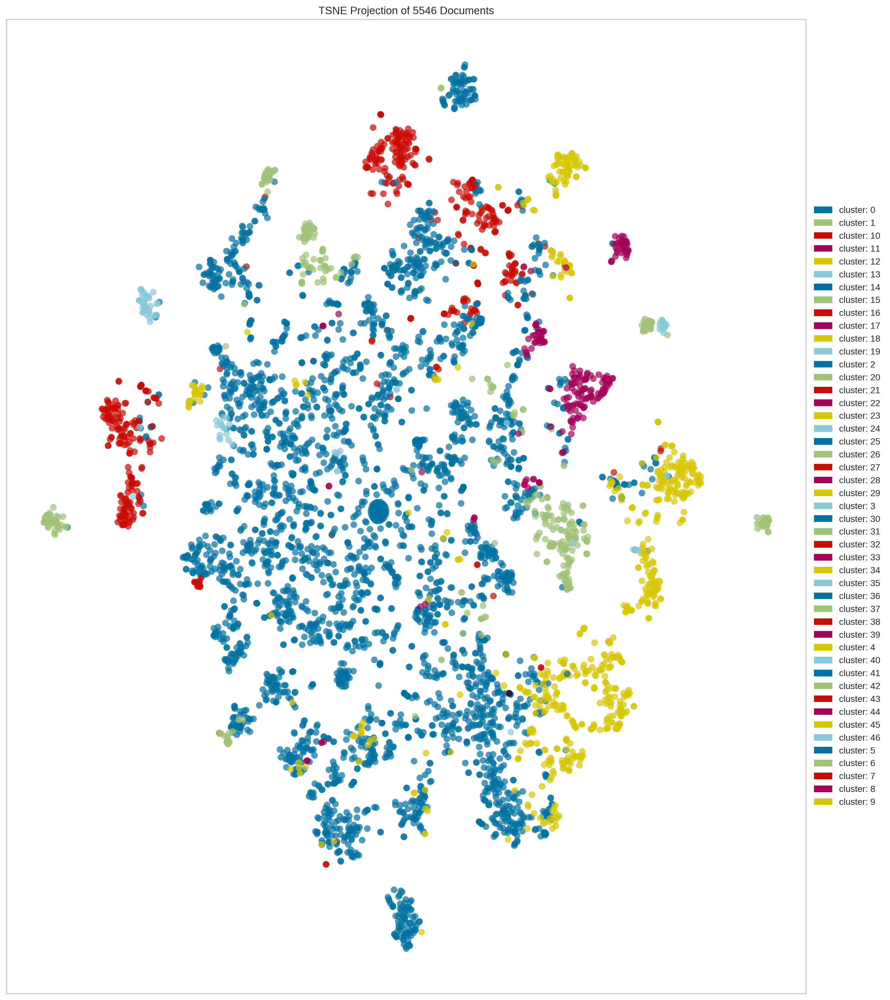

In [ ]:
import matplotlib.pyplot as plt
plt.figure(num=1, figsize=(20, 20), dpi=200, facecolor='w', edgecolor='k')
tsne = TSNEVisualizer()
tsne.fit(data_vectorizedtf, ["cluster: {}".format(c) for c in kmeans_tf.labels_])
tsne.poof()

In [ ]:
clusters = kmeans_tf.labels_.tolist()

films = {'cluster': clusters }

frame = pd.DataFrame(films, index = [clusters] , columns = ['cluster'])

In [ ]:
frame['cluster'].value_counts()

25    3382
18     571
21     305
38     167
15     160
14     137
11     126
31      83
4       72
36      68
30      47
20      42
28      38
6       38
13      37
8       33
45      31
37      29
42      25
40      21
29      20
26      18
35      18
27      17
24      13
43      12
39       6
33       4
41       3
44       2
7        2
46       2
32       2
22       2
1        1
5        1
9        1
34       1
10       1
17       1
3        1
2        1
16       1
12       1
19       1
23       1
0        1
Name: cluster, dtype: int64

In [ ]:
# agg clustring on tfidf
n_cluster=33
agg_tf = AgglomerativeClustering(n_clusters=n_cluster)
agg_tf.fit(data_vectorizedtf.toarray())

AgglomerativeClustering(affinity='euclidean', compute_full_tree='auto',
            connectivity=None, linkage='ward', memory=None, n_clusters=33,
            pooling_func='deprecated')

In [ ]:
clustering = agg_tf.labels_.tolist()
tfdf = pd.DataFrame(data_vectorizedtf.toarray(),columns=vectorizertf.get_feature_names())
tfdf=tfdf.iloc[:,9:]
tfdf['label']=clustering
tfdf.head()

,aboveground,absence,absent,absolute,absorbance,absorbed,absorption,abstract,abundance,abundant,...,zane,zea,zeolite,zero,zeta,zinc,zno,zone,zoning,zsm
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
for n in range(n_cluster):
    print('top Words in Cluster:',n)
    mx=np.array((tfdf.loc[tfdf['label'] == n]).sum())
    word_ind=mx.argsort()[-11:][::-1]
    for ind in word_ind:
        print(tfdf.columns[ind])

top Words in Cluster: 0
gene
dna
expression
genotype
genetic
pcr
virus
cell
infection
protein
vaccine
top Words in Cluster: 1
label
temperature
concentration
property
production
surface
composite
sample
particle
cell
high
top Words in Cluster: 2
label
cell
cancer
tumor
expression
stem
differentiation
breast
mouse
msc
sscs
top Words in Cluster: 3
label
language
text
persian
islamic
poet
literature
story
political
teacher
iranian
top Words in Cluster: 4
label
equation
numerical
flow
heat
energy
nonlinear
simulation
experimental
solution
stress
top Words in Cluster: 5
label
patient
woman
student
health
intervention
education
care
questionnaire
educational
factor
top Words in Cluster: 6
label
acid
oil
extraction
extract
fatty
antioxidant
solvent
seed
content
phenolic
top Words in Cluster: 7
label
area
factor
research
iran
fuzzy
index
variable
new
performance
water
top Words in Cluster: 8
label
cultivar
fruit
leaf
temperature
stress
drought
plant
day
forage
cold
top Words in Cluster: 9
labe

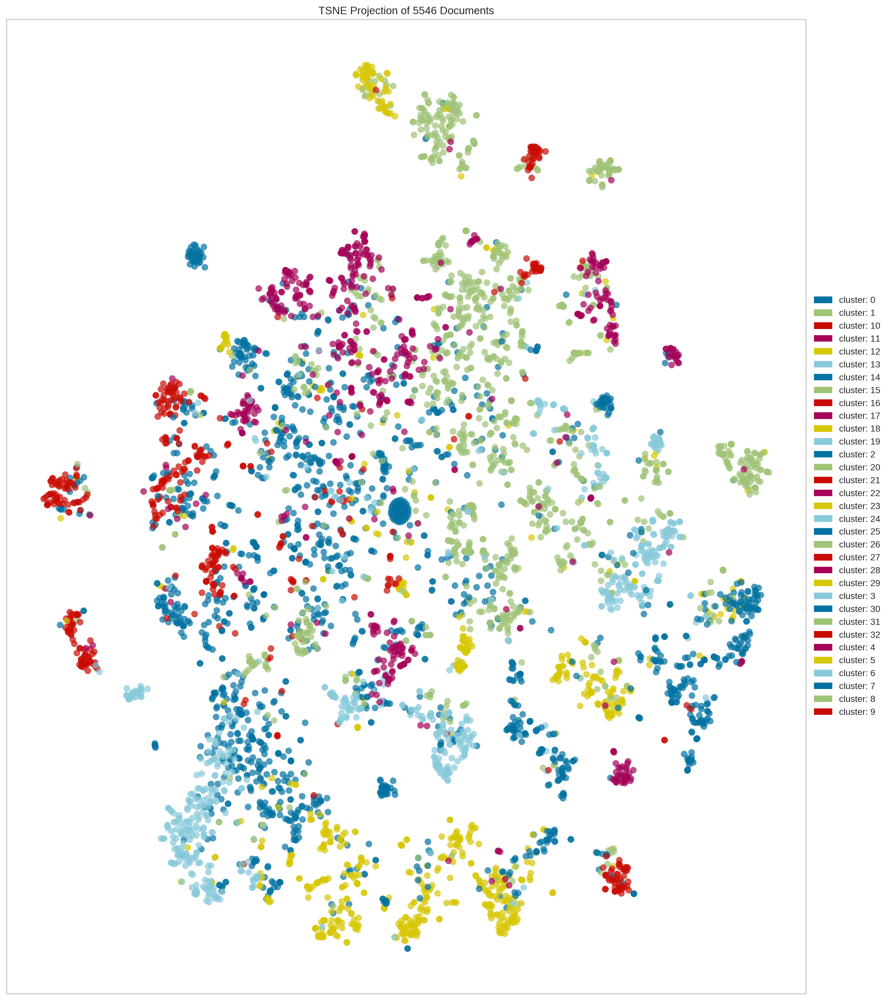

In [ ]:
plt.figure(num=1, figsize=(20, 20), dpi=200, facecolor='w', edgecolor='k')

tsne = TSNEVisualizer()
tsne.fit(data_vectorizedtf, ["cluster: {}".format(c) for c in agg_tf.labels_])
tsne.poof()

In [ ]:
tfdf['label'].value_counts()

7     1338
1      778
4      392
18     316
5      296
3      241
0      238
10     205
8      199
24     163
19     110
2      106
20     105
9      104
17      98
31      87
6       81
13      77
27      73
15      69
11      69
12      61
21      54
22      40
23      40
16      33
30      31
14      30
26      27
32      25
28      22
25      22
29      16
Name: label, dtype: int64

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

vectorizertf = CountVectorizer(analyzer='word',       
                             min_df=10,                        # minimum reqd occurences of a word 
                             stop_words='english',             # remove stop words
                             lowercase=True,                   # convert all words to lowercase
                             token_pattern='[a-zA-Z0-9]{3,}',  # num chars > 3
                             max_features=50000,             # max number of uniq words
                            )
data_vectorizedtf = vectorizertf.fit_transform(corpus)
data_vectorizedtf

<5546x4979 sparse matrix of type '<class 'numpy.int64'>'
	with 314213 stored elements in Compressed Sparse Row format>

In [ ]:
#kmeans for clustring
n_cluster=39
kmeans_tf = KMeans(n_clusters=n_cluster, init='k-means++', max_iter=100, n_init=1)
kmeans_tf.fit(data_vectorizedtf)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=100,
    n_clusters=39, n_init=1, n_jobs=None, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)

In [ ]:
print("Top terms per cluster:")
order_centroidstf = kmeans_tf.cluster_centers_.argsort()[:, ::-1]
termstf = vectorizertf.get_feature_names()
for i in range(n_cluster):
    print("Cluster %d:" % i),
    for ind in order_centroidstf[i, :10]:
        print(' %s' % termstf[ind]),
    print

Top terms per cluster:
Cluster 0:
 fear
 cancer
 woman
 content
 qualitative
 strategy
 breast
 death
 promise
 preventive
Cluster 1:
 concentration
 temperature
 respectively
 activity
 rate
 surface
 property
 high
 sample
 increased
Cluster 2:
 discourse
 story
 state
 change
 action
 main
 semantic
 semantics
 form
 narrative
Cluster 3:
 soil
 rainfall
 runoff
 erosion
 plot
 factor
 concentration
 water
 loss
 intensity
Cluster 4:
 slope
 soil
 trail
 skid
 density
 traffic
 pass
 bulk
 treatment
 runoff
Cluster 5:
 factor
 health
 research
 woman
 questionnaire
 student
 test
 education
 iran
 knowledge
Cluster 6:
 oil
 essential
 acid
 activity
 antioxidant
 extraction
 concentration
 value
 extract
 production
Cluster 7:
 linear
 quadratic
 non
 amplitude
 diet
 dependent
 natural
 frequency
 beam
 alfalfa
Cluster 8:
 seed
 bank
 soil
 vegetation
 specie
 forest
 ground
 germination
 habitat
 density
Cluster 9:
 earthquake
 area
 social
 capacity
 identity
 province
 risk
 cond

In [ ]:
kmeans_cluster={}
for i in range(n_cluster):
    kmeans_cluster['cluste:'+str(i)]=[]
    for ind in order_centroidstf[i, :10]:
        kmeans_cluster['cluste:'+str(i)].append(termstf[ind])
   
kmeans_cluster.keys()

dict_keys(['cluste:0', 'cluste:1', 'cluste:2', 'cluste:3', 'cluste:4', 'cluste:5', 'cluste:6', 'cluste:7', 'cluste:8', 'cluste:9', 'cluste:10', 'cluste:11', 'cluste:12', 'cluste:13', 'cluste:14', 'cluste:15', 'cluste:16', 'cluste:17', 'cluste:18', 'cluste:19', 'cluste:20', 'cluste:21', 'cluste:22', 'cluste:23', 'cluste:24', 'cluste:25', 'cluste:26', 'cluste:27', 'cluste:28', 'cluste:29', 'cluste:30', 'cluste:31', 'cluste:32', 'cluste:33', 'cluste:34', 'cluste:35', 'cluste:36', 'cluste:37', 'cluste:38'])

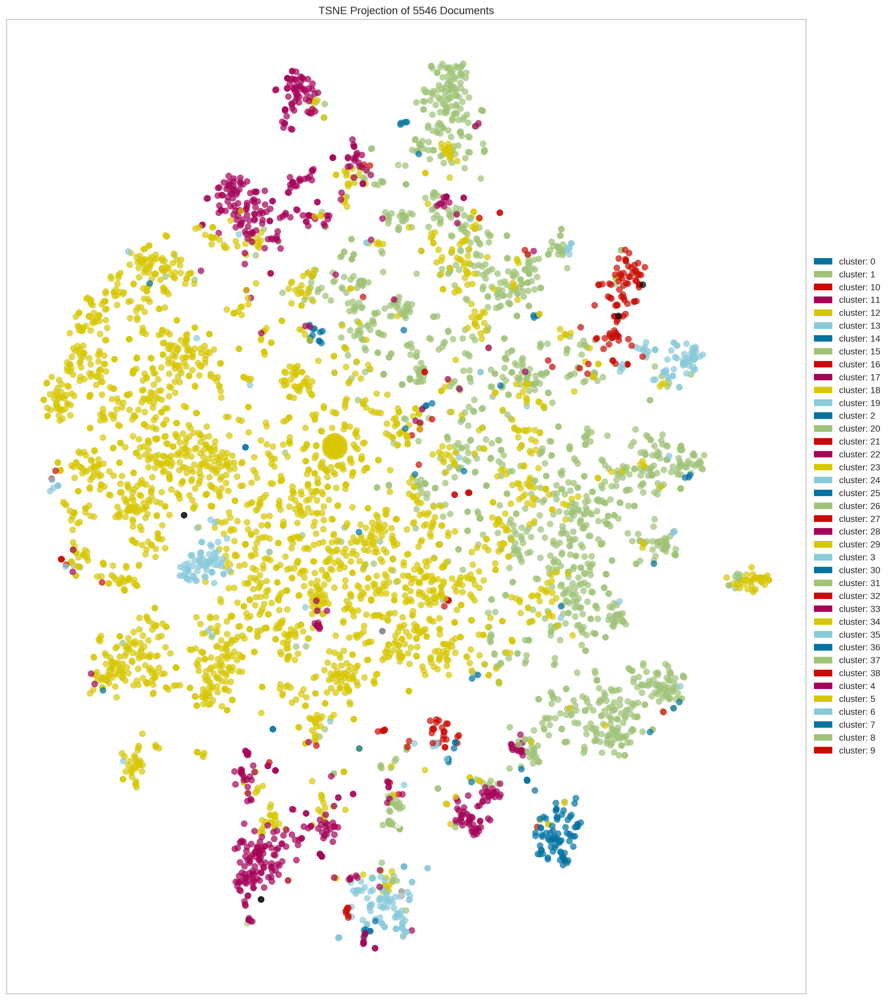

In [ ]:
plt.figure(num=1, figsize=(20, 20), dpi=200, facecolor='w', edgecolor='k')
tsne = TSNEVisualizer()
tsne.fit(data_vectorizedtf, ["cluster: {}".format(c) for c in kmeans_tf.labels_])
tsne.poof()

In [ ]:
clusters = kmeans_tf.labels_.tolist()

films = {'cluster': clusters }

frame = pd.DataFrame(films, index = [clusters] , columns = ['cluster'])

In [ ]:
frame['cluster'].value_counts()

12    2256
1     1413
5      448
17     263
11     232
31     162
25     108
27      99
3       86
13      81
6       81
22      60
10      52
23      29
18      26
8       25
14      21
33      13
4        9
19       9
24       8
9        8
36       7
16       7
15       7
30       6
20       4
29       4
35       3
37       3
2        3
38       3
7        3
32       2
28       1
21       1
26       1
34       1
0        1
Name: cluster, dtype: int64

In [ ]:
#agg clustring
n_cluster=29
agg_tf = AgglomerativeClustering(n_clusters=n_cluster)
agg_tf.fit(data_vectorizedtf.toarray())

AgglomerativeClustering(affinity='euclidean', compute_full_tree='auto',
            connectivity=None, linkage='ward', memory=None, n_clusters=29,
            pooling_func='deprecated')

In [ ]:
clustering = agg_tf.labels_.tolist()
tfdf = pd.DataFrame(data_vectorizedtf.toarray(),columns=vectorizertf.get_feature_names())
tfdf=tfdf.iloc[:,9:]
tfdf['label']=clustering
tfdf.head()

,aboveground,absence,absent,absolute,absorbance,absorbed,absorption,abstract,abundance,abundant,...,zane,zea,zeolite,zero,zeta,zinc,zno,zone,zoning,zsm
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
tfdf[['label']].head()

,label
0,0
1,8
2,15
3,6
4,25


In [ ]:
for n in range(n_cluster):
    print('top Words in Cluster:',n)
    mx=np.array((tfdf.loc[tfdf['label'] == n]).sum())
    word_ind=mx.argsort()[-11:][::-1]
    for ind in word_ind:
        print(tfdf.columns[ind])

top Words in Cluster: 0
activity
cell
production
protein
growth
control
significant
day
treatment
sample
concentration
top Words in Cluster: 1
label
problem
network
new
performance
power
parameter
solution
structure
function
design
top Words in Cluster: 2
land
change
use
label
cover
area
impact
soil
climate
river
iran
top Words in Cluster: 3
soil
label
slope
runoff
erosion
rainfall
plot
forest
area
sediment
water
top Words in Cluster: 4
label
research
factor
iran
area
development
language
risk
management
iranian
country
top Words in Cluster: 5
label
specie
iran
tree
forest
genus
plant
soil
new
area
diversity
top Words in Cluster: 6
label
leaf
stress
yield
plant
water
treatment
content
increased
acid
drought
top Words in Cluster: 7
rural
social
label
capacity
identity
woman
earthquake
participation
village
development
economic
top Words in Cluster: 8
label
temperature
property
surface
rate
energy
phase
high
parameter
process
concentration
top Words in Cluster: 9
label
woman
student
heal

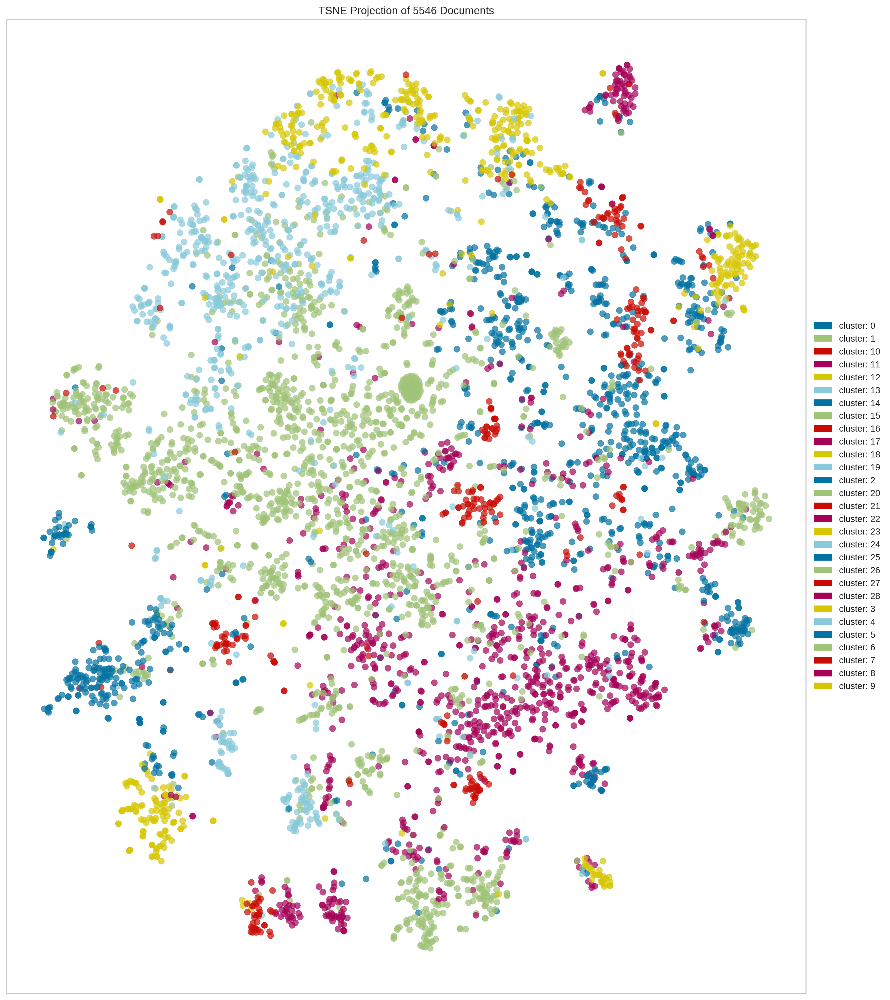

In [ ]:
plt.figure(num=1, figsize=(20, 20), dpi=200, facecolor='w', edgecolor='k')
tsne = TSNEVisualizer()
tsne.fit(data_vectorizedtf, ["cluster: {}".format(c) for c in agg_tf.labels_])
tsne.poof()

In [ ]:
tfdf['label'].value_counts()

1     1438
0      834
8      762
4      622
15     202
10     193
9      179
5      169
12     129
3      121
22      95
11      91
23      90
21      86
20      69
6       63
17      60
19      52
14      50
16      39
2       38
28      36
18      30
26      29
25      25
24      21
13      17
7        5
27       1
Name: label, dtype: int64

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

vectorizertf = CountVectorizer(analyzer='word',       
                             min_df=10,                        # minimum reqd occurences of a word 
                             stop_words='english',             # remove stop words
                             lowercase=True,                   # convert all words to lowercase
                             token_pattern='[a-zA-Z0-9]{3,}',  # num chars > 3
                             max_features=50000,             # max number of uniq words
                            )
data_vectorizedtf = vectorizertf.fit_transform(corpus)
data_vectorizedtf

<5546x4979 sparse matrix of type '<class 'numpy.int64'>'
	with 314213 stored elements in Compressed Sparse Row format>

In [ ]:
vectorizer = CountVectorizer(analyzer='word',       
                             min_df=10,                        # minimum reqd occurences of a word 
                             stop_words='english',             # remove stop words
                             lowercase=True,                   # convert all words to lowercase
                             token_pattern='[a-zA-Z0-9]{3,}',  # num chars > 3
                             max_features=50000,   )
docs       = vectorizer.fit_transform(corpus)
features   = vectorizer.get_feature_names()
docs

<5546x4979 sparse matrix of type '<class 'numpy.int64'>'
	with 314213 stored elements in Compressed Sparse Row format>

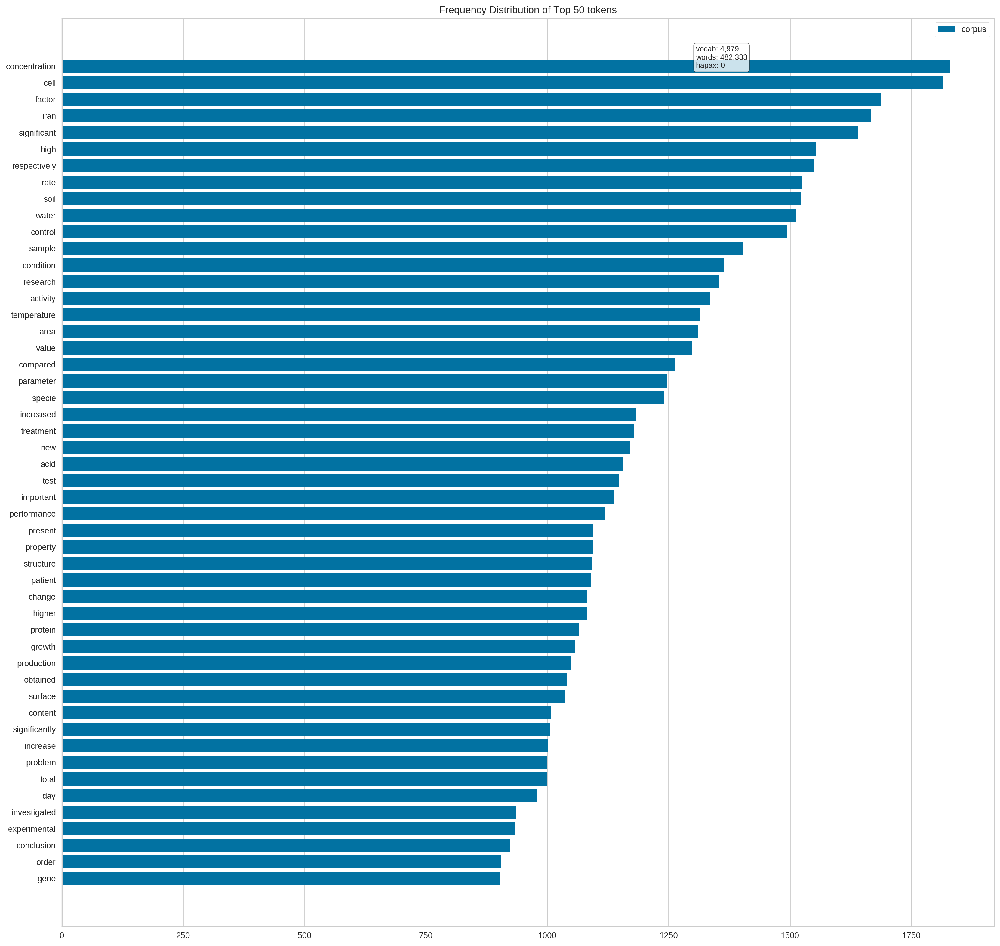

In [ ]:
plt.figure(num=1, figsize=(20, 20), dpi=200, facecolor='w', edgecolor='k')
visualizer = FreqDistVisualizer(features=features)
visualizer.fit(docs)
visualizer.poof()

In [ ]:
word_text=''
for e in range(len(corpus)):
    word_text=word_text+' '+corpus[e]
    
    

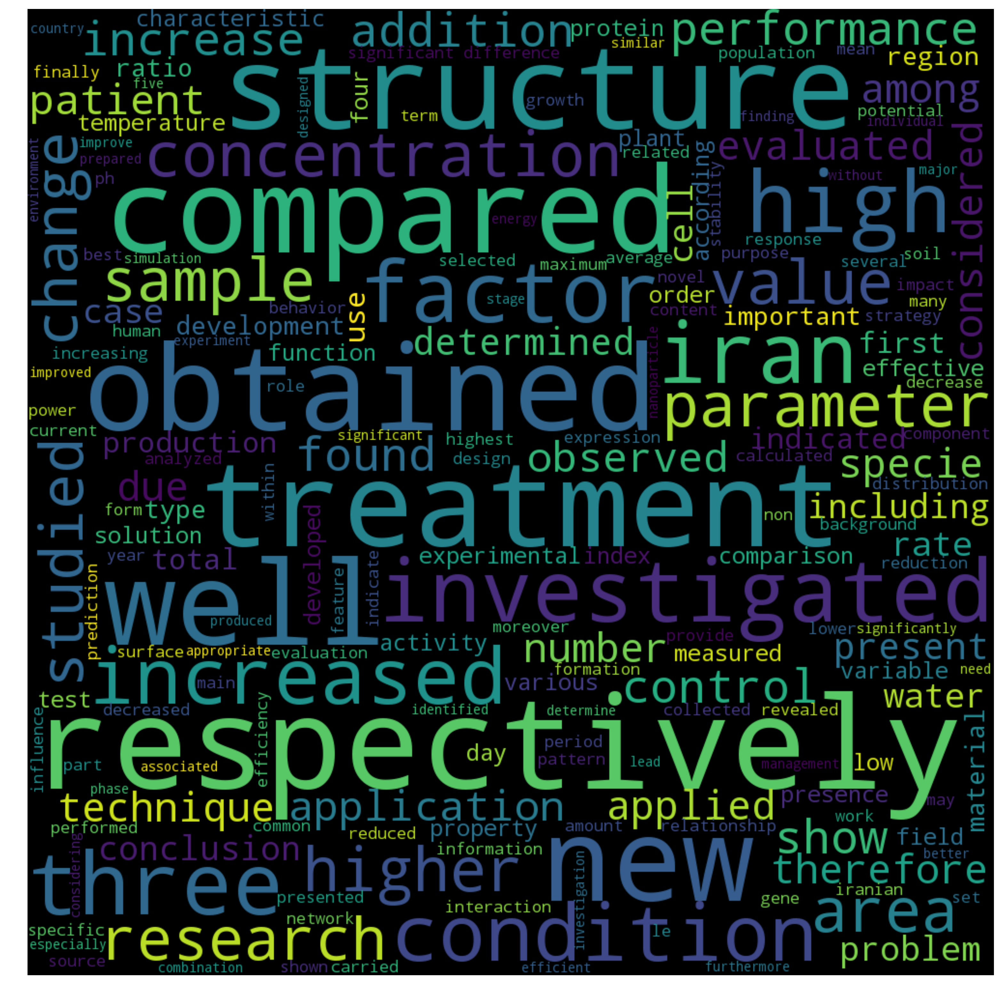

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
plt.figure(num=1, figsize=(20, 20), dpi=200, facecolor='w', edgecolor='k')
# Create the wordcloud object
wordcloud = WordCloud(width=1000, height=1000, margin=0).generate(word_text)
# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.margins(x=0, y=0)
plt.show()


**پیاده سازی الگوریتم LDA**

In [ ]:
import pandas as pd 
import numpy as np
import gensim
from gensim.utils import simple_preprocess
from gensim.parsing.preprocessing import STOPWORDS
from nltk.stem import WordNetLemmatizer, SnowballStemmer
from nltk.stem.porter import *
import numpy as np
np.random.seed(2018)
import nltk

In [ ]:
def lemmatize_stemming(text):
    stemmer = PorterStemmer()
    return stemmer.stem(WordNetLemmatizer().lemmatize(text, pos='v'))

def preprocess(text):
    result = []
    for token in gensim.utils.simple_preprocess(text):
        if token not in fr_stop_words:
            if token not in gensim.parsing.preprocessing.STOPWORDS and len(token) > 3:
                result.append(lemmatize_stemming(token))   
    return result

In [ ]:
processed_docs = df['article_content'].map(preprocess)

In [ ]:
dictionary = gensim.corpora.Dictionary(processed_docs)
dictionary.filter_extremes(no_below=15, no_above=0.5, keep_n=100000)

In [ ]:
bow_corpus = [dictionary.doc2bow(doc) for doc in processed_docs]

In [ ]:
bow_doc_4310 = bow_corpus[1]
for i in range(len(bow_doc_4310)):
    print("Word {} (\"{}\") appears {} time.".format(bow_doc_4310[i][0], 
                                               dictionary[bow_doc_4310[i][0]], 
bow_doc_4310[i][1]))

Word 7 ("compar") appears 1 time.
Word 15 ("evalu") appears 1 time.
Word 61 ("accept") appears 1 time.
Word 62 ("accord") appears 1 time.
Word 63 ("acid") appears 5 time.
Word 64 ("addit") appears 1 time.
Word 65 ("adhes") appears 7 time.
Word 66 ("affect") appears 1 time.
Word 67 ("chang") appears 3 time.
Word 68 ("classifi") appears 1 time.
Word 69 ("flour") appears 7 time.
Word 70 ("higher") appears 1 time.
Word 71 ("level") appears 1 time.
Word 72 ("lower") appears 1 time.
Word 73 ("mesh") appears 6 time.
Word 74 ("obtain") appears 1 time.
Word 75 ("particl") appears 1 time.
Word 76 ("resin") appears 1 time.
Word 77 ("shear") appears 6 time.
Word 78 ("size") appears 4 time.
Word 79 ("sodium") appears 3 time.
Word 80 ("soybean") appears 1 time.
Word 81 ("specimen") appears 1 time.
Word 82 ("standard") appears 1 time.
Word 83 ("strength") appears 6 time.
Word 84 ("sulfur") appears 2 time.
Word 85 ("urea") appears 1 time.


In [ ]:
from gensim import corpora, models
tfidf = models.TfidfModel(bow_corpus)
corpus_tfidf = tfidf[bow_corpus]
from pprint import pprint
for doc in corpus_tfidf:
    pprint(doc)
    break

[(0, 0.1255587090108965),
 (1, 0.03254293381396007),
 (2, 0.035510105715851455),
 (3, 0.143069393925932),
 (4, 0.1551245355728966),
 (5, 0.04337892585334766),
 (6, 0.04783829105511338),
 (7, 0.02297862785289478),
 (8, 0.09435895901859062),
 (9, 0.04545951882192987),
 (10, 0.0318567068036426),
 (11, 0.06562785100208748),
 (12, 0.14944858735712818),
 (13, 0.03094508361408194),
 (14, 0.042976411071470884),
 (15, 0.02519832663979457),
 (16, 0.18563866357989464),
 (17, 0.03113905370624329),
 (18, 0.04013229903341813),
 (19, 0.050427406117786136),
 (20, 0.07355045363737032),
 (21, 0.026877110087811178),
 (22, 0.05402813508342834),
 (23, 0.43664894585296243),
 (24, 0.07244577692453087),
 (25, 0.024451097548970197),
 (26, 0.09442186352167305),
 (27, 0.04186138416737887),
 (28, 0.18419560327371845),
 (29, 0.07827476303213839),
 (30, 0.04940133882512076),
 (31, 0.08468564907163524),
 (32, 0.5286638597084913),
 (33, 0.0919219623886368),
 (34, 0.16937129814327048),
 (35, 0.0581286097055485),
 (36,

In [ ]:
lda_model = gensim.models.LdaMulticore(bow_corpus, num_topics=10, id2word=dictionary, passes=2, workers=2)

In [ ]:
for idx, topic in lda_model.print_topics(-1):
    print('Topic: {} \nWords: {}'.format(idx, topic))

Topic: 0 
Words: 0.009*"model" + 0.007*"temperatur" + 0.007*"water" + 0.006*"method" + 0.006*"develop" + 0.006*"iran" + 0.005*"valu" + 0.005*"paramet" + 0.005*"compar" + 0.005*"predict"
Topic: 1 
Words: 0.008*"soil" + 0.007*"increas" + 0.007*"area" + 0.007*"speci" + 0.006*"nanoparticl" + 0.006*"effect" + 0.005*"indic" + 0.005*"properti" + 0.005*"water" + 0.005*"respect"
Topic: 2 
Words: 0.008*"control" + 0.007*"effect" + 0.007*"patient" + 0.005*"activ" + 0.005*"rate" + 0.005*"extract" + 0.005*"increas" + 0.005*"system" + 0.005*"develop" + 0.005*"test"
Topic: 3 
Words: 0.008*"seed" + 0.008*"effect" + 0.006*"compar" + 0.006*"bank" + 0.005*"optim" + 0.005*"investig" + 0.005*"studi" + 0.005*"increas" + 0.005*"test" + 0.005*"soil"
Topic: 4 
Words: 0.009*"problem" + 0.007*"optim" + 0.006*"design" + 0.005*"effect" + 0.005*"evalu" + 0.005*"effici" + 0.005*"control" + 0.005*"method" + 0.005*"perform" + 0.004*"sediment"
Topic: 5 
Words: 0.010*"speci" + 0.008*"water" + 0.008*"research" + 0.006*"a

In [ ]:
import pyLDAvis.gensim as gensimvis
import pyLDAvis

In [ ]:

vis_data = gensimvis.prepare(lda_model, bow_corpus, dictionary)
pyLDAvis.display(vis_data)

In [ ]:
lda_model_tfidf = gensim.models.LdaMulticore(corpus_tfidf, num_topics=10, id2word=dictionary, passes=2, workers=4)
for idx, topic in lda_model_tfidf.print_topics(-1):
    print('Topic: {} Word: {}'.format(idx, topic))

Topic: 0 Word: 0.003*"nanoparticl" + 0.003*"educ" + 0.002*"soil" + 0.002*"water" + 0.002*"intervent" + 0.002*"control" + 0.002*"cell" + 0.002*"group" + 0.002*"structur" + 0.002*"women"
Topic: 1 Word: 0.003*"soil" + 0.003*"imag" + 0.003*"model" + 0.002*"area" + 0.002*"optim" + 0.002*"predict" + 0.002*"temperatur" + 0.002*"structur" + 0.002*"land" + 0.002*"factor"
Topic: 2 Word: 0.003*"speci" + 0.003*"soil" + 0.003*"concentr" + 0.003*"iran" + 0.002*"remov" + 0.002*"qualiti" + 0.002*"factor" + 0.002*"acid" + 0.002*"sediment" + 0.002*"design"
Topic: 3 Word: 0.007*"cell" + 0.004*"activ" + 0.004*"express" + 0.003*"carbon" + 0.003*"protein" + 0.003*"gene" + 0.003*"concentr" + 0.003*"structur" + 0.003*"temperatur" + 0.002*"membran"
Topic: 4 Word: 0.004*"film" + 0.004*"activ" + 0.003*"extract" + 0.003*"sediment" + 0.003*"temperatur" + 0.003*"protein" + 0.003*"content" + 0.003*"concentr" + 0.003*"isol" + 0.003*"speci"
Topic: 5 Word: 0.003*"nurs" + 0.003*"educ" + 0.003*"product" + 0.002*"research

In [ ]:
vis_data = gensimvis.prepare(lda_model_tfidf, corpus_tfidf, dictionary)
pyLDAvis.display(vis_data)